# Tugas Analisis Multimedia: **Image (Citra Digital)**

**Mata Kuliah:** Sistem & Teknologi Multimedia  

**Nama:** Muhammad Fakhri Nur

**NIM:** 122140034

**Link Repository:** https://github.com/Sovenable/Worksheet-Multimedia.git
---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami **representasi dasar data citra digital (image)** melalui praktik langsung memuat data, visualisasi komponen warna, serta melakukan analisis spasial sederhana menggunakan berbagai teknik dasar pengolahan citra.

Anda akan bekerja dengan satu atau beberapa gambar (foto diri, objek, atau lingkungan sekitar) untuk:

* Mengamati struktur data piksel dan channel warna (RGB, Grayscale, HSV, dsb.)
* Menganalisis perbedaan hasil visualisasi antar representasi warna
* Melakukan eksplorasi sederhana terhadap transformasi citra (cropping, filtering, edge detection, dll.)
* Menyimpulkan pengaruh setiap tahap pemrosesan terhadap persepsi visual

Fokus tugas ini adalah pada **pemahaman konsep representasi spasial citra digital** dan **interpretasi hasil visualisasi**, **bukan** pada manipulasi kompleks atau penerapan model pembelajaran mesin.

### **Soal 1 — Cropping dan Konversi Warna**

* Ambil sebuah gambar diri Anda (*selfie*) menggunakan kamera atau smartphone.
* Lakukan **cropping secara manual** untuk menghasilkan dua potongan:

  * Cropping **kotak persegi pada area wajah**.
  * Cropping **persegi panjang pada area latar belakang**.
* Resize hasil crop menjadi **920×920 piksel**.
* Konversi gambar menjadi **grayscale** dan **HSV**, lalu tampilkan ketiganya berdampingan.
* Tambahkan **anotasi teks** berisi nama Anda di atas kepala pada gambar hasil crop.

  * Gaya teks (font, warna, posisi, ukuran, ketebalan) **dibebaskan**.
* Jelaskan efek **cropping** dan **perubahan warna** menggunakan **Markdown**.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

ModuleNotFoundError: No module named 'cv2'

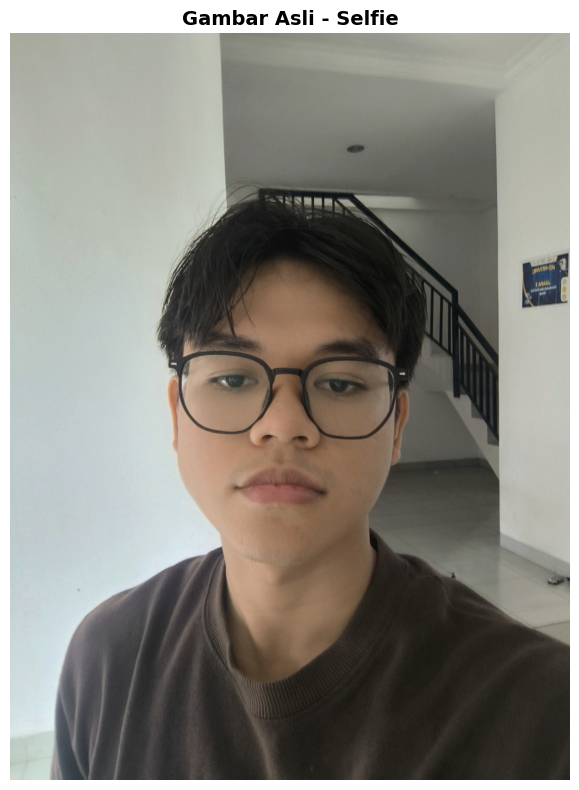

Ukuran gambar asli: (2303, 1727, 3)
➤ Tinggi: 2303px, Lebar: 1727px, Channel: 3


In [ ]:
# Load gambar selfie
img_path = 'foto_selfie.jpg'
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Tampilkan gambar asli
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.title('Gambar Asli - Selfie', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"Ukuran gambar asli: {img_rgb.shape}")
print(f"➤ Tinggi: {img_rgb.shape[0]}px, Lebar: {img_rgb.shape[1]}px, Channel: {img_rgb.shape[2]}")

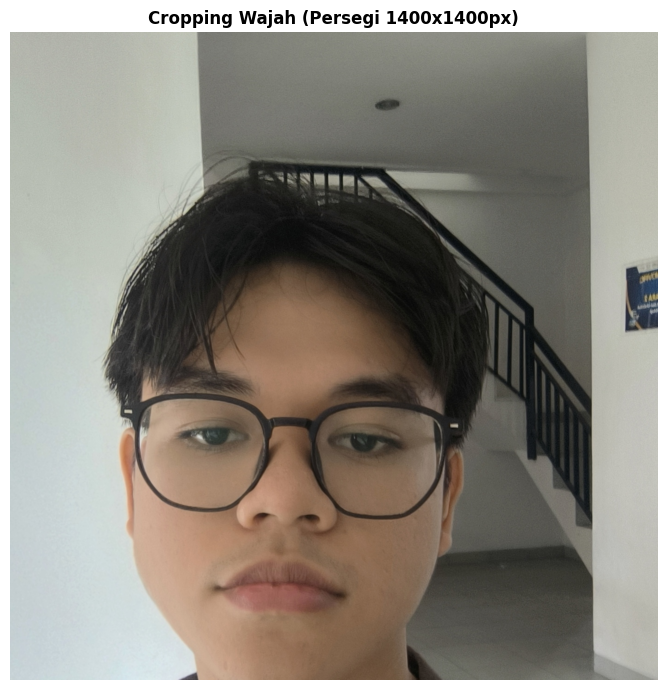

In [ ]:
# Cropping area wajah - FOKUS KE MUKA SAJA (Persegi)
# Koordinat disesuaikan dengan posisi wajah kamu

x1_face = 250    # geser lebih ke kiri
y1_face = 200    # geser lebih ke atas
x2_face = 1900   # tambah area kanan
y2_face = 1600   # tambah area bawah


# Pastikan bentuknya persegi
width_face = x2_face - x1_face
height_face = y2_face - y1_face
size_face = min(width_face, height_face)

# Crop area wajah (kotak persegi fokus ke muka)
crop_face = img_rgb[y1_face:y1_face+size_face, x1_face:x1_face+size_face].copy()

# Tampilkan hasil crop
plt.figure(figsize=(7, 7))
plt.imshow(crop_face)
plt.title(f'Cropping Wajah (Persegi {size_face}x{size_face}px)', fontsize=12, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


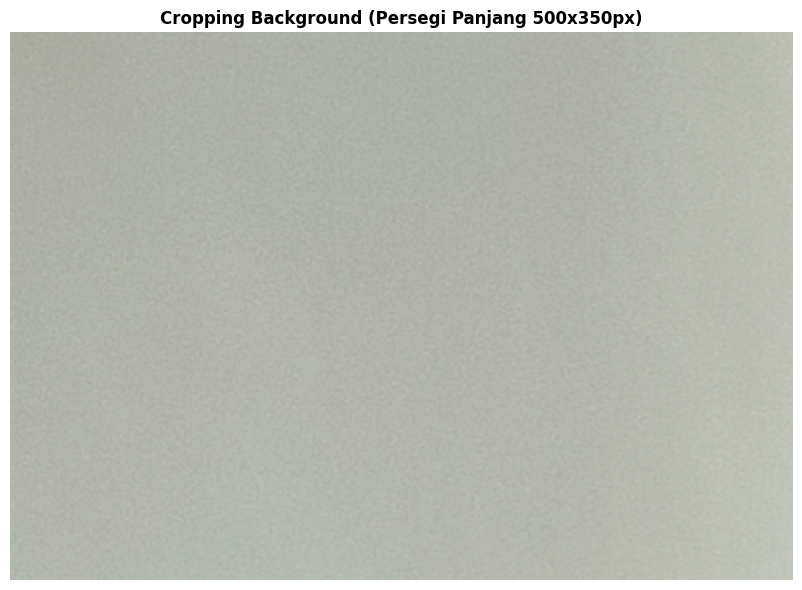

In [ ]:
x1_bg = 100      
y1_bg = 50      
x2_bg = 600    
y2_bg = 400    

# Crop area background
crop_background = img_rgb[y1_bg:y2_bg, x1_bg:x2_bg].copy()

# Hitung ukuran
width_bg = x2_bg - x1_bg
height_bg = y2_bg - y1_bg

# Tampilkan hasil crop
plt.figure(figsize=(10, 6))
plt.imshow(crop_background)
plt.title(f'Cropping Background (Persegi Panjang {width_bg}x{height_bg}px)', 
          fontsize=12, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()



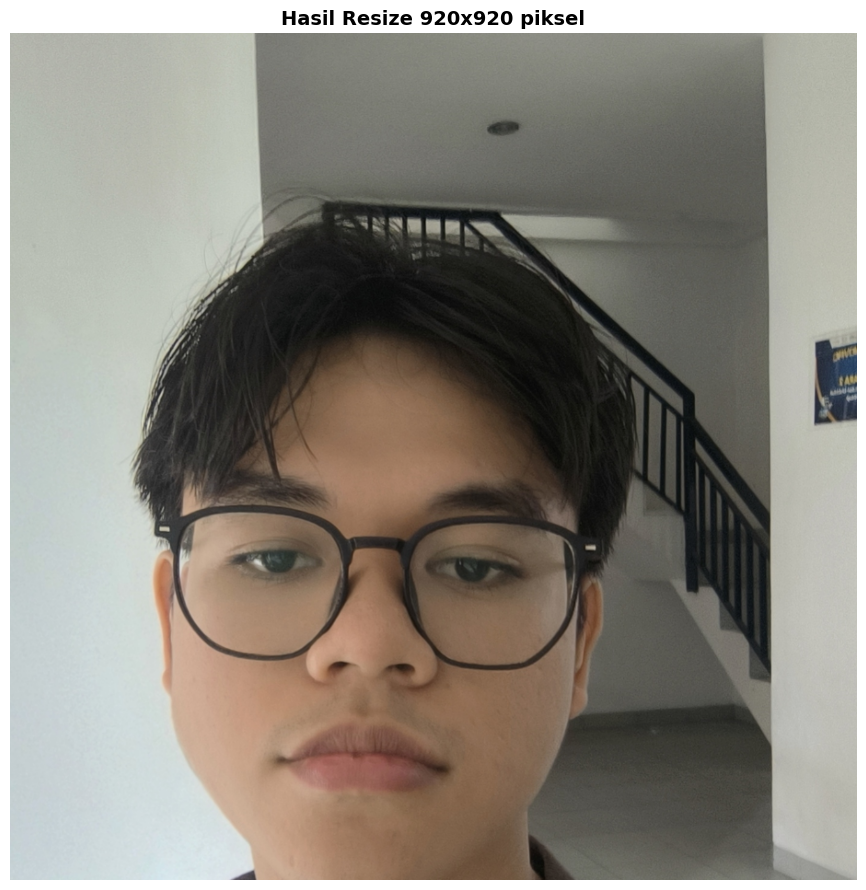

✓ Resize berhasil!
➤ Ukuran sebelum resize: (1400, 1400, 3)
➤ Ukuran setelah resize: (920, 920, 3)
➤ Target: 920x920 piksel


In [ ]:
# Resize crop wajah ke 920x920 piksel
target_size = (920, 920)
crop_face_resized = cv2.resize(crop_face, target_size, interpolation=cv2.INTER_LINEAR)

# Tampilkan hasil resize
plt.figure(figsize=(9, 9))
plt.imshow(crop_face_resized)
plt.title(f'Hasil Resize {target_size[0]}x{target_size[1]} piksel', 
          fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"➤ Ukuran sebelum resize: {crop_face.shape}")
print(f"➤ Ukuran setelah resize: {crop_face_resized.shape}")
print(f"➤ Target: {target_size[0]}x{target_size[1]} piksel")

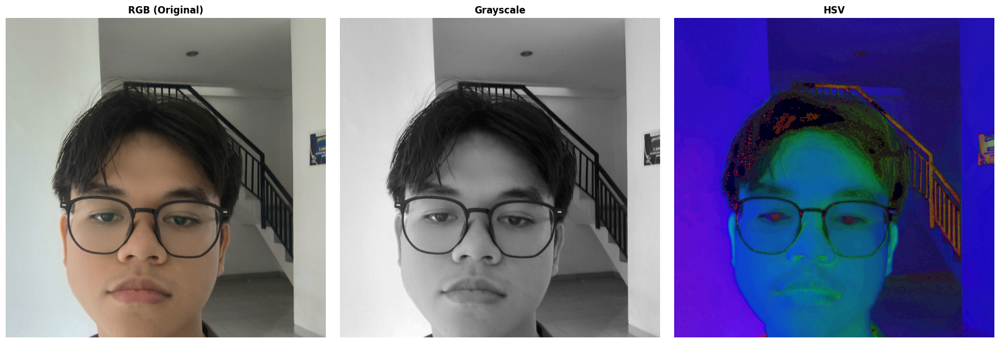

✓ Tampilan berdampingan berhasil!
  RGB: (920, 920, 3) - 3 channel (Red, Green, Blue)
  Grayscale: (920, 920) - 1 channel (Intensitas)
  HSV: (920, 920, 3) - 3 channel (Hue, Saturation, Value)


In [ ]:
# Konversi hasil resize ke Grayscale
crop_face_gray = cv2.cvtColor(crop_face_resized, cv2.COLOR_RGB2GRAY)

# Konversi hasil resize ke HSV
crop_face_hsv = cv2.cvtColor(crop_face_resized, cv2.COLOR_RGB2HSV)

# Tampilkan ketiganya dalam satu figure (berdampingan)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. RGB (Original)
axes[0].imshow(crop_face_resized)
axes[0].set_title('RGB (Original)', fontsize=12, fontweight='bold')
axes[0].axis('off')

# 2. Grayscale
axes[1].imshow(crop_face_gray, cmap='gray')
axes[1].set_title('Grayscale', fontsize=12, fontweight='bold')
axes[1].axis('off')

# 3. HSV
axes[2].imshow(crop_face_hsv)
axes[2].set_title('HSV', fontsize=12, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()


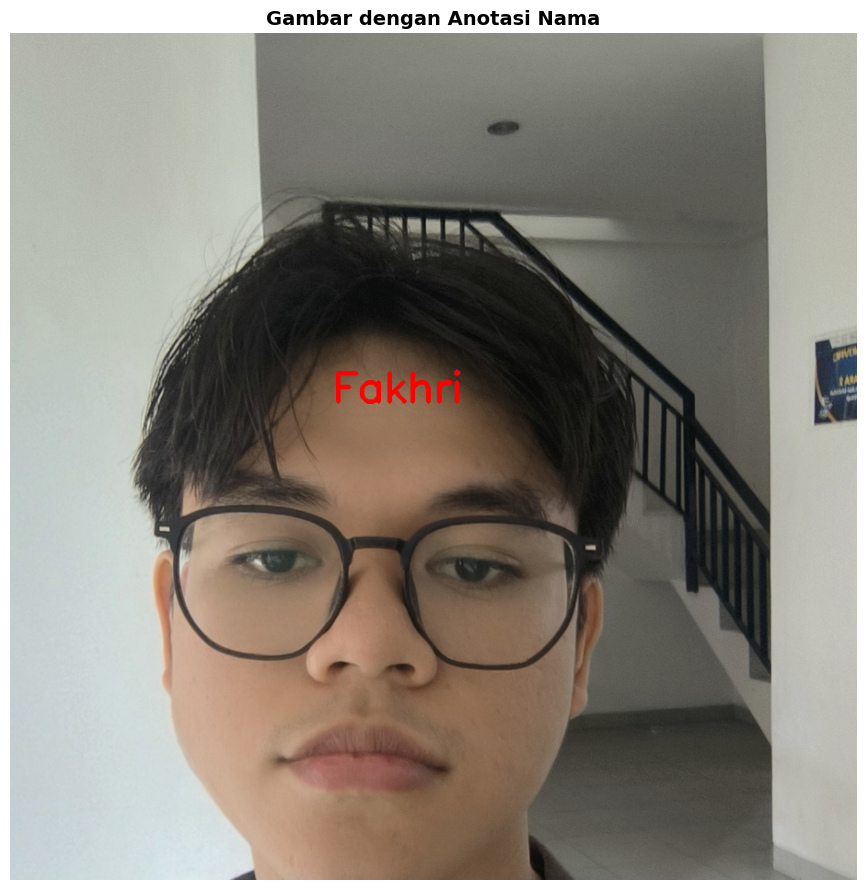

In [ ]:
# Tambahkan anotasi teks nama di atas kepala pada gambar RGB
crop_face_annotated = crop_face_resized.copy()

# Tentukan posisi teks (di atas kepala)
text = "Fakhri"  # Ganti dengan nama kamu
position = (350, 400)  # koordinat (x, y) - sesuaikan posisi


# Tambahkan teks ke gambar
cv2.putText(crop_face_annotated, text, position, font, font_scale, color, thickness)

# Tampilkan hasil
plt.figure(figsize=(9, 9))
plt.imshow(crop_face_annotated)
plt.title('Gambar dengan Anotasi Nama', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


### **Soal 2 — Manipulasi Channel Warna RGB**

* Gunakan gambar hasil crop dari Soal 1.
* Konversikan gambar ke ruang warna **RGB**.
* Lakukan manipulasi channel warna dengan cara:

  * **Naikkan intensitas channel merah sebanyak 50 poin** (maksimum 255).
  * **Turunkan intensitas channel biru sebanyak 30 poin** (minimum 0).
* Teknik atau cara menaikkan/menurunkan intensitas **dibebaskan**, asalkan logis dan hasilnya terlihat.
* Gabungkan kembali channel warna dan **simpan gambar hasil modifikasi dalam format `.png`**.
* **Tampilkan histogram per channel (R, G, B)** untuk gambar asli dan hasil modifikasi menggunakan `matplotlib.pyplot.hist`.
* Jelaskan dampak perubahan RGB pada warna gambar dalam sel **Markdown**.


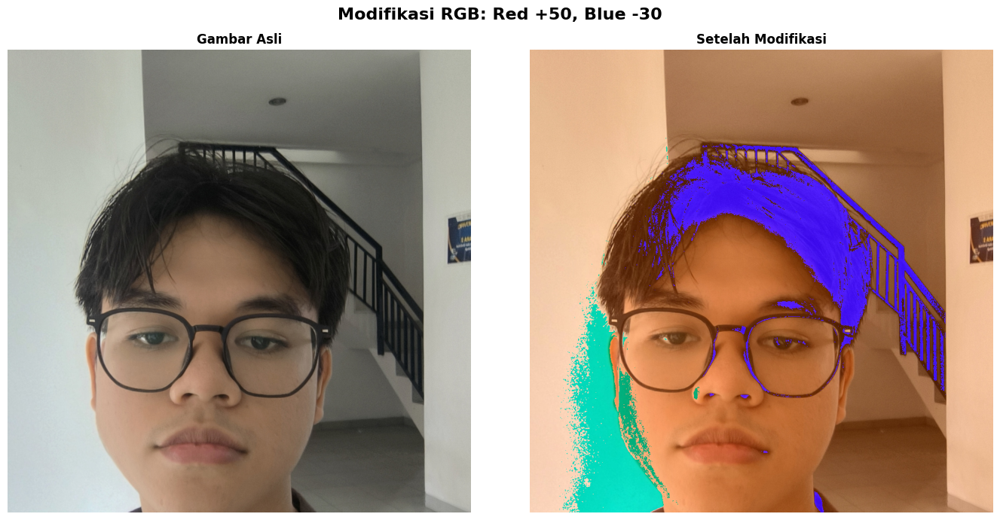

✓ Manipulasi selesai!
  • Red: +50 poin
  • Green: tidak berubah
  • Blue: -30 poin


In [ ]:
nilai_tambah_red = 50   
nilai_kurang_blue = 30   

# Pisahkan channel RGB
R, G, B = cv2.split(crop_face_resized)

# Manipulasi channel
R_modified = np.clip(R + nilai_tambah_red, 0, 255).astype(np.uint8)
B_modified = np.clip(B - nilai_kurang_blue, 0, 255).astype(np.uint8)
G_modified = G.copy()  # Green tidak berubah

# Gabungkan kembali
img_modified = cv2.merge([R_modified, G_modified, B_modified])

# Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle(f'Modifikasi RGB: Red +{nilai_tambah_red}, Blue -{nilai_kurang_blue}', 
             fontsize=16, fontweight='bold')

axes[0].imshow(crop_face_resized)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img_modified)
axes[1].set_title(f'Setelah Modifikasi', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"✓ Manipulasi selesai!")
print(f"  • Red: +{nilai_tambah_red} poin")
print(f"  • Green: tidak berubah")
print(f"  • Blue: -{nilai_kurang_blue} poin")

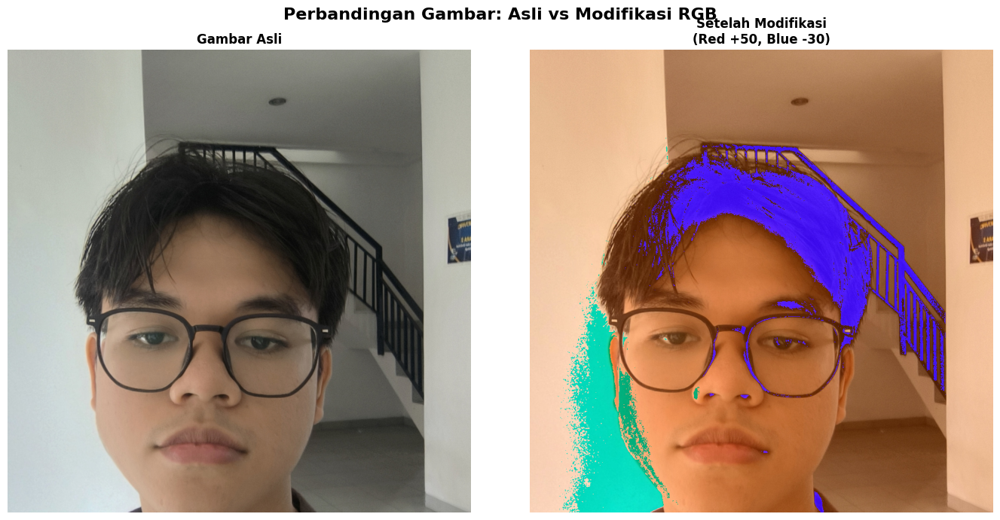

✓ Channel berhasil digabungkan kembali!
➤ Ukuran gambar hasil modifikasi: (920, 920, 3)


In [ ]:
# Gabungkan kembali channel yang sudah dimodifikasi
img_modified = cv2.merge([R_modified, G_modified, B_modified])

# Tampilkan perbandingan gambar asli vs hasil modifikasi
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle('Perbandingan Gambar: Asli vs Modifikasi RGB', fontsize=16, fontweight='bold')

# Gambar asli
axes[0].imshow(crop_face_resized)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Gambar hasil modifikasi
axes[1].imshow(img_modified)
axes[1].set_title(f'Setelah Modifikasi\n(Red +{nilai_tambah_red}, Blue -{nilai_kurang_blue})', 
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"✓ Channel berhasil digabungkan kembali!")
print(f"➤ Ukuran gambar hasil modifikasi: {img_modified.shape}")

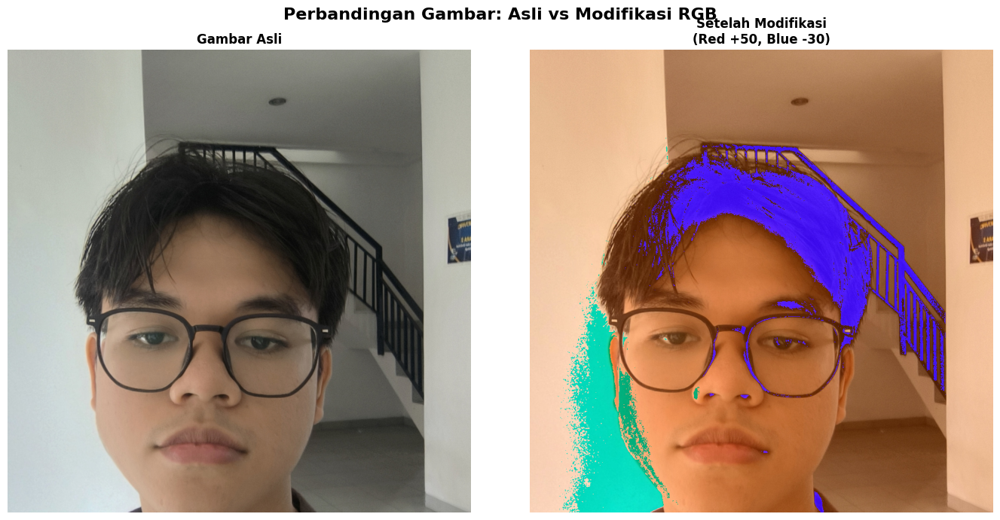

✓ Channel berhasil digabungkan kembali!
➤ Ukuran gambar hasil modifikasi: (920, 920, 3)

✓ Gambar berhasil disimpan!
➤ Path: crop_face_rgb_modified.png
➤ Format: PNG


In [ ]:
# Gabungkan kembali channel yang sudah dimodifikasi
img_modified = cv2.merge([R_modified, G_modified, B_modified])

# Tampilkan perbandingan gambar asli vs hasil modifikasi
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle('Perbandingan Gambar: Asli vs Modifikasi RGB', fontsize=16, fontweight='bold')

# Gambar asli
axes[0].imshow(crop_face_resized)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Gambar hasil modifikasi
axes[1].imshow(img_modified)
axes[1].set_title(f'Setelah Modifikasi\n(Red +{nilai_tambah_red}, Blue -{nilai_kurang_blue})', 
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"✓ Channel berhasil digabungkan kembali!")
print(f"➤ Ukuran gambar hasil modifikasi: {img_modified.shape}")

# Konversi RGB ke BGR untuk disimpan dengan OpenCV
img_modified_bgr = cv2.cvtColor(img_modified, cv2.COLOR_RGB2BGR)

# Simpan dalam format PNG ke folder results_ws4
output_path = 'crop_face_rgb_modified.png'
cv2.imwrite(output_path, img_modified_bgr)

print(f"\n✓ Gambar berhasil disimpan!")
print(f"➤ Path: {output_path}")
print(f"➤ Format: PNG")

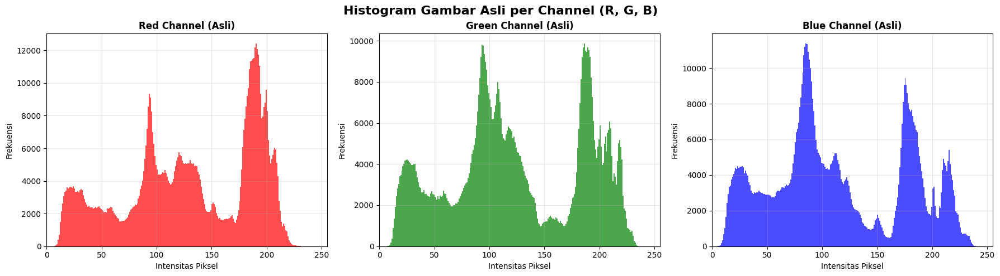

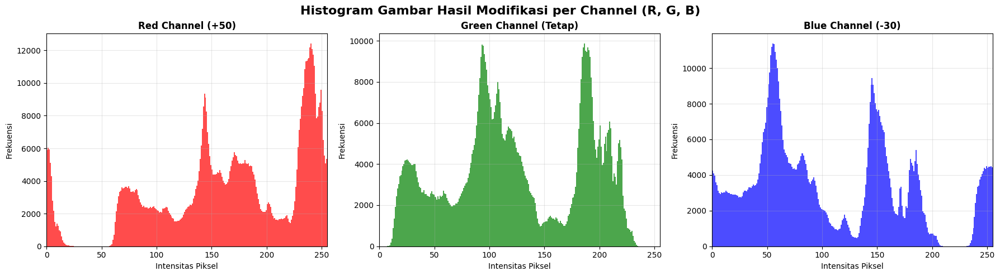

In [ ]:
# Histogram untuk gambar asli
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Histogram Gambar Asli per Channel (R, G, B)', fontsize=16, fontweight='bold')

# Histogram Red Channel
axes[0].hist(R.ravel(), bins=256, range=[0, 256], color='red', alpha=0.7)
axes[0].set_title('Red Channel (Asli)', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Intensitas Piksel', fontsize=10)
axes[0].set_ylabel('Frekuensi', fontsize=10)
axes[0].set_xlim([0, 255])
axes[0].grid(True, alpha=0.3)

# Histogram Green Channel
axes[1].hist(G.ravel(), bins=256, range=[0, 256], color='green', alpha=0.7)
axes[1].set_title('Green Channel (Asli)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Intensitas Piksel', fontsize=10)
axes[1].set_ylabel('Frekuensi', fontsize=10)
axes[1].set_xlim([0, 255])
axes[1].grid(True, alpha=0.3)

# Histogram Blue Channel
axes[2].hist(B.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
axes[2].set_title('Blue Channel (Asli)', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Intensitas Piksel', fontsize=10)
axes[2].set_ylabel('Frekuensi', fontsize=10)
axes[2].set_xlim([0, 255])
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


# Histogram untuk gambar hasil modifikasi
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Histogram Gambar Hasil Modifikasi per Channel (R, G, B)', 
             fontsize=16, fontweight='bold')

# Histogram Red Channel (Modified)
axes[0].hist(R_modified.ravel(), bins=256, range=[0, 256], color='red', alpha=0.7)
axes[0].set_title(f'Red Channel (+{nilai_tambah_red})', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Intensitas Piksel', fontsize=10)
axes[0].set_ylabel('Frekuensi', fontsize=10)
axes[0].set_xlim([0, 255])
axes[0].grid(True, alpha=0.3)

# Histogram Green Channel (Tidak berubah)
axes[1].hist(G_modified.ravel(), bins=256, range=[0, 256], color='green', alpha=0.7)
axes[1].set_title('Green Channel (Tetap)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Intensitas Piksel', fontsize=10)
axes[1].set_ylabel('Frekuensi', fontsize=10)
axes[1].set_xlim([0, 255])
axes[1].grid(True, alpha=0.3)

# Histogram Blue Channel (Modified)
axes[2].hist(B_modified.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
axes[2].set_title(f'Blue Channel (-{nilai_kurang_blue})', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Intensitas Piksel', fontsize=10)
axes[2].set_ylabel('Frekuensi', fontsize=10)
axes[2].set_xlim([0, 255])
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


### **Soal 3 — Deteksi Tepi dan Filter Citra**

* Ambil gambar **objek dengan background bertekstur** (misalnya kain bermotif, jerami, atau batu).
* Terapkan **edge detection (Canny)** dan tampilkan hasilnya.
* Lakukan **thresholding dengan nilai ambang tertentu** (bebas Anda tentukan) agar hanya objek utama yang tersisa.
* Buat **bounding box** di sekitar objek hasil segmentasi (boleh manual atau otomatis).
* Terapkan **filter blur** dan **filter sharpening**, lalu **bandingkan hasil keduanya**.
* Jelaskan bagaimana setiap filter memengaruhi detail gambar dalam format **Markdown**.


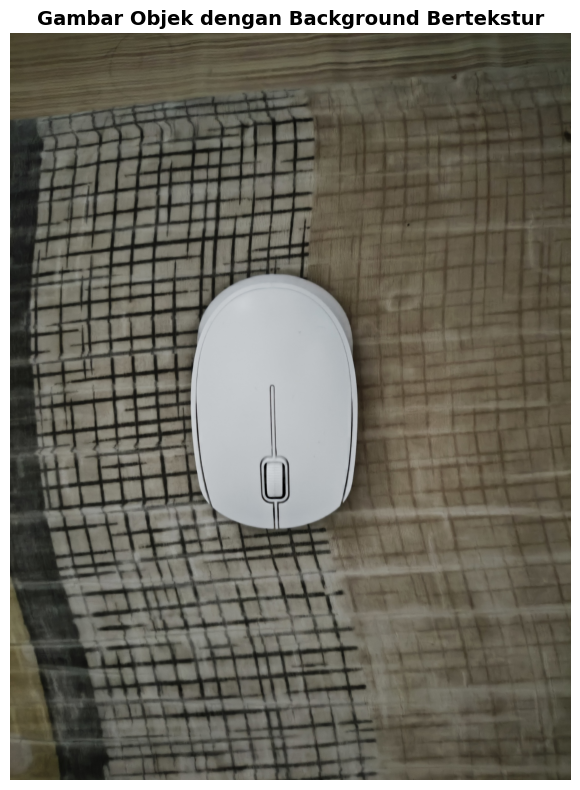

In [ ]:
# Load gambar objek dengan background bertekstur
# Gunakan foto_tekstur.jpg yang sudah kamu upload
img_obj_path = 'foto_tesktur.jpg'
img_obj = cv2.imread(img_obj_path)
img_obj_rgb = cv2.cvtColor(img_obj, cv2.COLOR_BGR2RGB)

# Tampilkan gambar asli
plt.figure(figsize=(10, 8))
plt.imshow(img_obj_rgb)
plt.title('Gambar Objek dengan Background Bertekstur', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


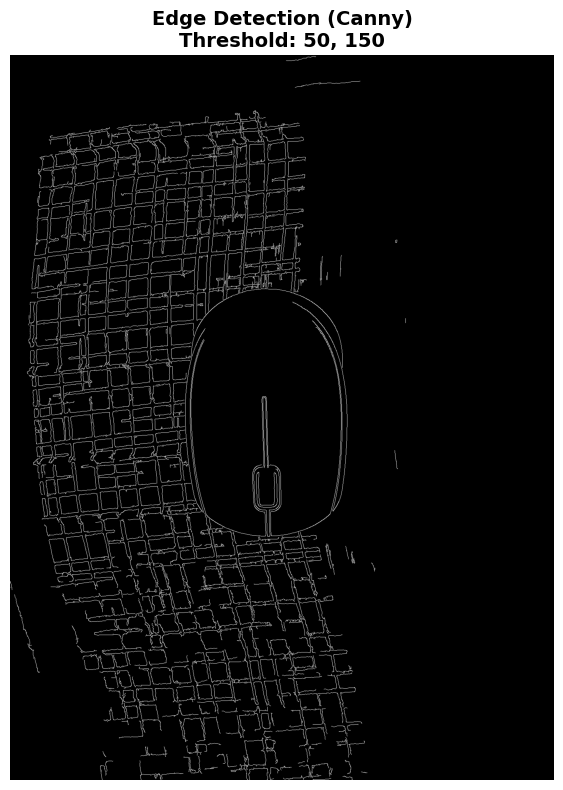

✓ Edge detection (Canny) berhasil!
➤ Threshold1 (low): 50
➤ Threshold2 (high): 150
➤ Ukuran edges: (1961, 1472)


In [ ]:
# Terapkan Edge Detection menggunakan Canny
# Parameter: threshold1 (low), threshold2 (high)
threshold1 = 50   # Threshold bawah - bisa diubah (0-255)
threshold2 = 150  # Threshold atas - bisa diubah (0-255)

edges = cv2.Canny(img_obj_rgb, threshold1, threshold2)

# Tampilkan hasil edge detection
plt.figure(figsize=(10, 8))
plt.imshow(edges, cmap='gray')
plt.title(f'Edge Detection (Canny)\nThreshold: {threshold1}, {threshold2}', 
          fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"✓ Edge detection (Canny) berhasil!")
print(f"➤ Threshold1 (low): {threshold1}")
print(f"➤ Threshold2 (high): {threshold2}")
print(f"➤ Ukuran edges: {edges.shape}")

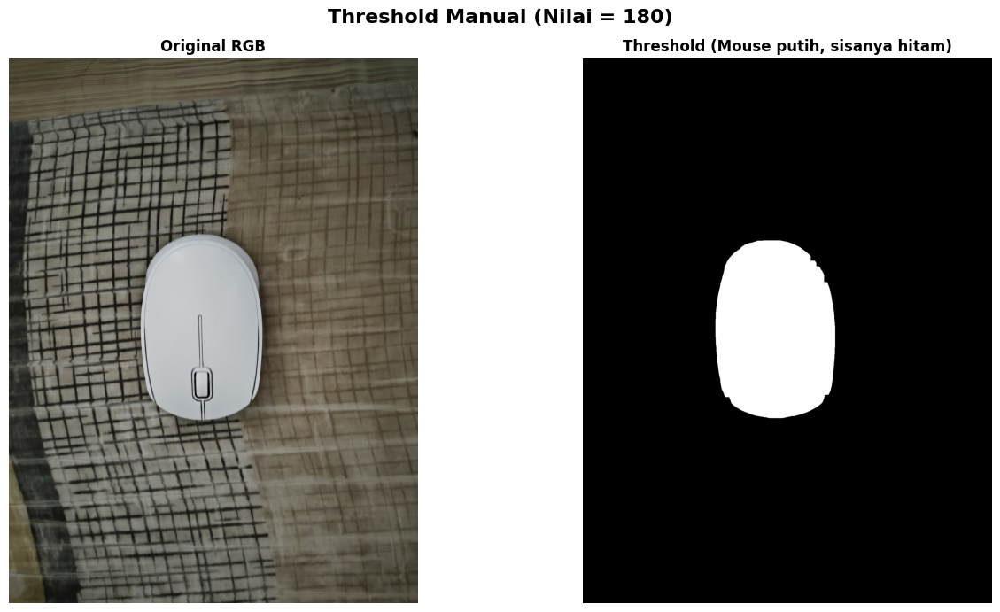

✓ Threshold dengan nilai 180
➤ Mouse harus putih solid, background hitam solid


In [ ]:
# Convert ke grayscale
img_obj_gray = cv2.cvtColor(img_obj_rgb, cv2.COLOR_RGB2GRAY)

# Terapkan Gaussian Blur lebih kuat untuk hilangkan tekstur kain
blur_obj = cv2.GaussianBlur(img_obj_gray, (15, 15), 0)

# Gunakan nilai threshold manual yang lebih tinggi
# Karena mouse putih (terang) dan background gelap
threshold_value = 180  # Coba nilai: 170, 180, 190, 200

_, thresh_result = cv2.threshold(blur_obj, threshold_value, 255, cv2.THRESH_BINARY)

# Bersihkan noise dengan morphology yang lebih agresif
kernel = np.ones((9, 9), np.uint8)
thresh_result = cv2.morphologyEx(thresh_result, cv2.MORPH_CLOSE, kernel, iterations=5)
thresh_result = cv2.morphologyEx(thresh_result, cv2.MORPH_OPEN, kernel, iterations=5)

# Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle(f'Threshold Manual (Nilai = {threshold_value})', fontsize=16, fontweight='bold')

axes[0].imshow(img_obj_rgb)
axes[0].set_title('Original RGB', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(thresh_result, cmap='gray')
axes[1].set_title('Threshold (Mouse putih, sisanya hitam)', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"✓ Threshold dengan nilai {threshold_value}")
print("➤ Mouse harus putih solid, background hitam solid")

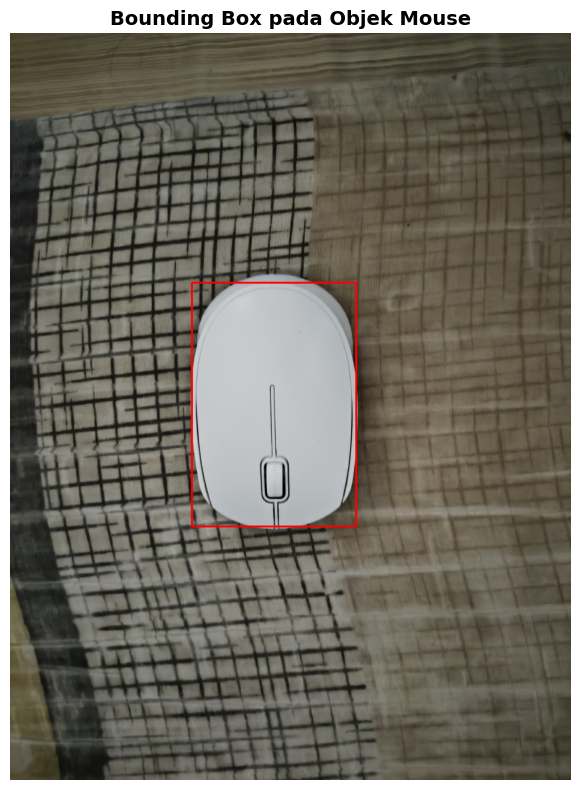

✓ Bounding box berhasil!
➤ Koordinat: x=477, y=655, lebar=431px, tinggi=640px


In [ ]:
# Pastikan thresh_result dalam format yang benar
if len(thresh_result.shape) == 3:
    thresh_result = cv2.cvtColor(thresh_result, cv2.COLOR_RGB2GRAY)

thresh_result = thresh_result.astype(np.uint8)

# Cari contours dari hasil threshold
contours, hierarchy = cv2.findContours(thresh_result, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Urutkan contours berdasarkan area (dari terbesar)
contours_sorted = sorted(contours, key=cv2.contourArea, reverse=True)

# Ambil contour terbesar (objek mouse)
largest_contour = contours_sorted[0]

# Dapatkan bounding box
x, y, w, h = cv2.boundingRect(largest_contour)

# Gambar bounding box pada gambar original
img_bbox = img_obj_rgb.copy()
cv2.rectangle(img_bbox, (x, y), (x+w, y+h), (255, 0, 0), 3)

# Tampilkan hasil
plt.figure(figsize=(10, 8))
plt.imshow(img_bbox)
plt.title('Bounding Box pada Objek Mouse', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"✓ Bounding box berhasil!")
print(f"➤ Koordinat: x={x}, y={y}, lebar={w}px, tinggi={h}px")

### **Soal 4 — Deteksi Wajah dan Filter Digital Kreatif**

* Ambil gambar diri Anda dengan ekspresi wajah **netral**.
* Lakukan **deteksi wajah dan landmark** menggunakan salah satu dari:

  * **MediaPipe**, atau
  * **Dlib**, atau
  * **OpenCV**.
* Buat **overlay filter digital kreatif** karya Anda sendiri, misalnya:

  * topi, kumis, masker, helm, aksesoris, atau bentuk unik lainnya.
  * Filter boleh dibuat dari **gambar eksternal (PNG)** *atau* digambar langsung (misal bentuk lingkaran, garis, poligon, dll).
* Pastikan posisi overlay menyesuaikan **landmark wajah** dengan logis.
* **Gunakan alpha blending sebagai saran** agar hasil tampak lebih natural.
* Tampilkan perbandingan antara **gambar asli** dan **hasil dengan filter**.
* Jelaskan bagaimana Anda menghitung posisi overlay dan tantangan yang dihadapi selama implementasi (gunakan **Markdown**).

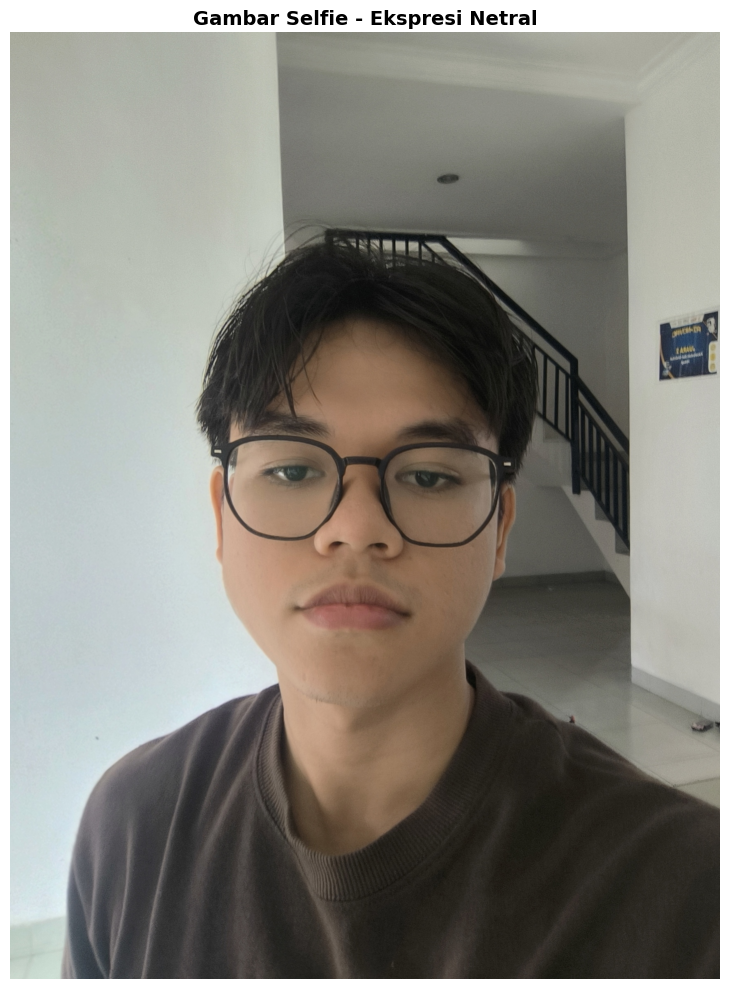

✓ Gambar selfie berhasil dimuat!
➤ Ukuran: (2303, 1727, 3)


In [ ]:
# Load gambar selfie (gunakan foto_selfie.jpg)
img_selfie = cv2.imread('foto_selfie.jpg')
img_selfie_rgb = cv2.cvtColor(img_selfie, cv2.COLOR_BGR2RGB)

# Tampilkan gambar
plt.figure(figsize=(8, 10))
plt.imshow(img_selfie_rgb)
plt.title('Gambar Selfie - Ekspresi Netral', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"✓ Gambar selfie berhasil dimuat!")
print(f"➤ Ukuran: {img_selfie_rgb.shape}")

In [ ]:
import urllib.request

# Download Haar Cascade untuk deteksi wajah
url_face = 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml'
urllib.request.urlretrieve(url_face, 'haarcascade_frontalface_default.xml')

# Download Haar Cascade untuk deteksi mata (opsional, untuk landmark)
url_eye = 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml'
urllib.request.urlretrieve(url_eye, 'haarcascade_eye.xml')

print("✓ Haar Cascade files berhasil didownload!")

✓ Haar Cascade files berhasil didownload!


✓ Jumlah wajah terdeteksi: 1
✓ Wajah terdeteksi di: x=463, y=730, w=831, h=831
✓ Jumlah mata terdeteksi: 4


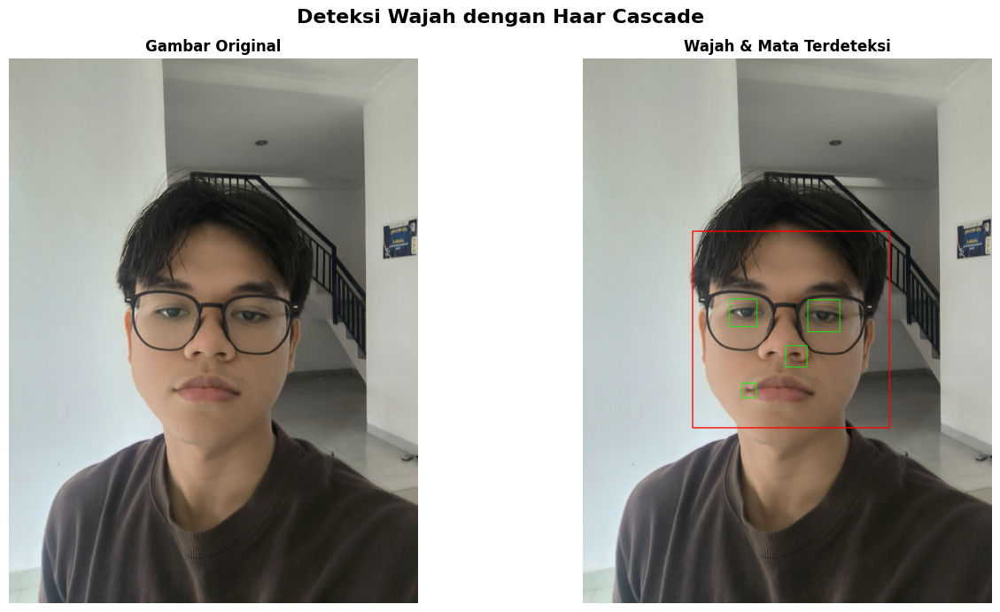

In [ ]:
# Load Haar Cascade classifier
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

# Convert ke grayscale untuk deteksi
img_gray = cv2.cvtColor(img_selfie_rgb, cv2.COLOR_RGB2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5, minSize=(100, 100))

print(f"✓ Jumlah wajah terdeteksi: {len(faces)}")

if len(faces) > 0:
    # Ambil wajah pertama
    (x_face, y_face, w_face, h_face) = faces[0]
    
    # Deteksi mata dalam area wajah
    roi_gray = img_gray[y_face:y_face+h_face, x_face:x_face+w_face]
    roi_color = img_selfie_rgb[y_face:y_face+h_face, x_face:x_face+w_face]
    
    eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=10)
    
    print(f"✓ Wajah terdeteksi di: x={x_face}, y={y_face}, w={w_face}, h={h_face}")
    print(f"✓ Jumlah mata terdeteksi: {len(eyes)}")
    
    # Gambar kotak di wajah dan mata
    img_detected = img_selfie_rgb.copy()
    cv2.rectangle(img_detected, (x_face, y_face), (x_face+w_face, y_face+h_face), (255, 0, 0), 3)
    
    for (x_eye, y_eye, w_eye, h_eye) in eyes:
        cv2.rectangle(img_detected, (x_face+x_eye, y_face+y_eye), 
                     (x_face+x_eye+w_eye, y_face+y_eye+h_eye), (0, 255, 0), 2)
    
    # Tampilkan hasil
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))
    fig.suptitle('Deteksi Wajah dengan Haar Cascade', fontsize=16, fontweight='bold')
    
    axes[0].imshow(img_selfie_rgb)
    axes[0].set_title('Gambar Original', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(img_detected)
    axes[1].set_title('Wajah & Mata Terdeteksi', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
else:
    print("⚠ Wajah tidak terdeteksi!")

In [ ]:
# Hitung posisi kumis berdasarkan deteksi wajah dan mata
if len(faces) > 0 and len(eyes) >= 2:
    # Urutkan mata dari kiri ke kanan
    eyes = sorted(eyes, key=lambda e: e[0])
    
    # Ambil 2 mata pertama (kiri dan kanan)
    eye_left = eyes[0]
    eye_right = eyes[1]
    
    # Koordinat mata (relatif ke area wajah)
    eye_left_x = x_face + eye_left[0] + eye_left[2]//2
    eye_left_y = y_face + eye_left[1] + eye_left[3]//2
    
    eye_right_x = x_face + eye_right[0] + eye_right[2]//2
    eye_right_y = y_face + eye_right[1] + eye_right[3]//2
    
    # Hitung posisi kumis (di bawah hidung, di antara mata)
    # Posisi kumis = tengah antara 2 mata, turun ke bawah
    mustache_center_x = (eye_left_x + eye_right_x) // 2
    mustache_center_y = eye_left_y + int((y_face + h_face - eye_left_y) * 0.5)
    
    # Lebar kumis = jarak antara 2 mata
    mustache_width = abs(eye_right_x - eye_left_x)
    mustache_height = mustache_width // 2
    
    print(f"✓ Posisi kumis dihitung:")
    print(f"➤ Center: ({mustache_center_x}, {mustache_center_y})")
    print(f"➤ Width: {mustache_width}px")
    print(f"➤ Height: {mustache_height}px")
else:
    print("⚠ Tidak bisa menghitung posisi kumis (mata kurang dari 2)")

✓ Posisi kumis dihitung:
➤ Center: (688, 1318)
➤ Width: 23px
➤ Height: 11px


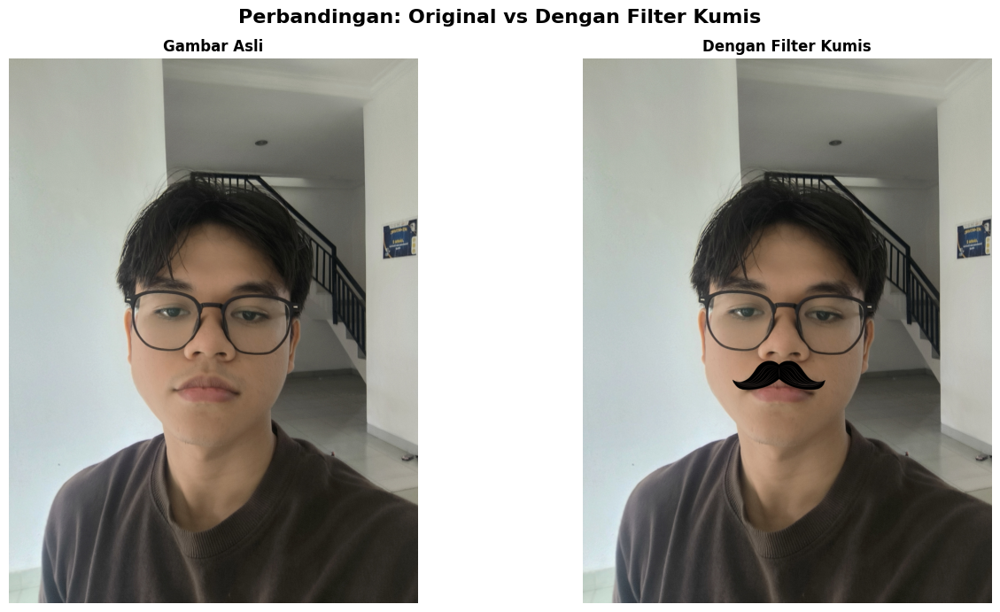

✓ Kumis berhasil di-overlay!
➤ Offset: x=130, y=20


In [ ]:
# Resize kumis dengan ukuran yang pas
kumis_w = mustache_width * 25  
kumis_h = int(kumis_rgb.shape[0] * (kumis_w / kumis_rgb.shape[1]))

kumis_resized = cv2.resize(kumis_rgb, (kumis_w, kumis_h), interpolation=cv2.INTER_AREA)

# Pisahkan channel RGB dan Alpha
if kumis_resized.shape[2] == 4:
    kumis_color = kumis_resized[:, :, :3]
    kumis_alpha = kumis_resized[:, :, 3] / 255.0
else:
    kumis_color = kumis_resized
    gray = cv2.cvtColor(kumis_resized, cv2.COLOR_RGB2GRAY)
    kumis_alpha = (gray < 250).astype(float)

# GESER POSISI KUMIS KE BAWAH
offset_y = 20  
offset_x = 130   

# Hitung posisi overlay dengan offset
x1 = mustache_center_x - kumis_w // 2 + offset_x
y1 = mustache_center_y - kumis_h // 2 + offset_y
x2 = x1 + kumis_w
y2 = y1 + kumis_h

# Pastikan tidak keluar batas
x1 = max(0, x1)
y1 = max(0, y1)
x2 = min(img_selfie_rgb.shape[1], x2)
y2 = min(img_selfie_rgb.shape[0], y2)

# Sesuaikan ukuran jika keluar batas
kumis_w_actual = x2 - x1
kumis_h_actual = y2 - y1

if kumis_w_actual != kumis_w or kumis_h_actual != kumis_h:
    kumis_color = cv2.resize(kumis_color, (kumis_w_actual, kumis_h_actual))
    kumis_alpha = cv2.resize(kumis_alpha, (kumis_w_actual, kumis_h_actual))

# Copy gambar original
img_with_mustache = img_selfie_rgb.copy()

# Extract ROI
roi = img_with_mustache[y1:y2, x1:x2]

# Alpha blending
for c in range(3):
    roi[:, :, c] = (kumis_alpha * kumis_color[:, :, c] + 
                    (1 - kumis_alpha) * roi[:, :, c])

# Tempelkan kembali
img_with_mustache[y1:y2, x1:x2] = roi

# Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle('Perbandingan: Original vs Dengan Filter Kumis', fontsize=16, fontweight='bold')

axes[0].imshow(img_selfie_rgb)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img_with_mustache)
axes[1].set_title('Dengan Filter Kumis', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"✓ Kumis berhasil di-overlay!")
print(f"➤ Offset: x={offset_x}, y={offset_y}")

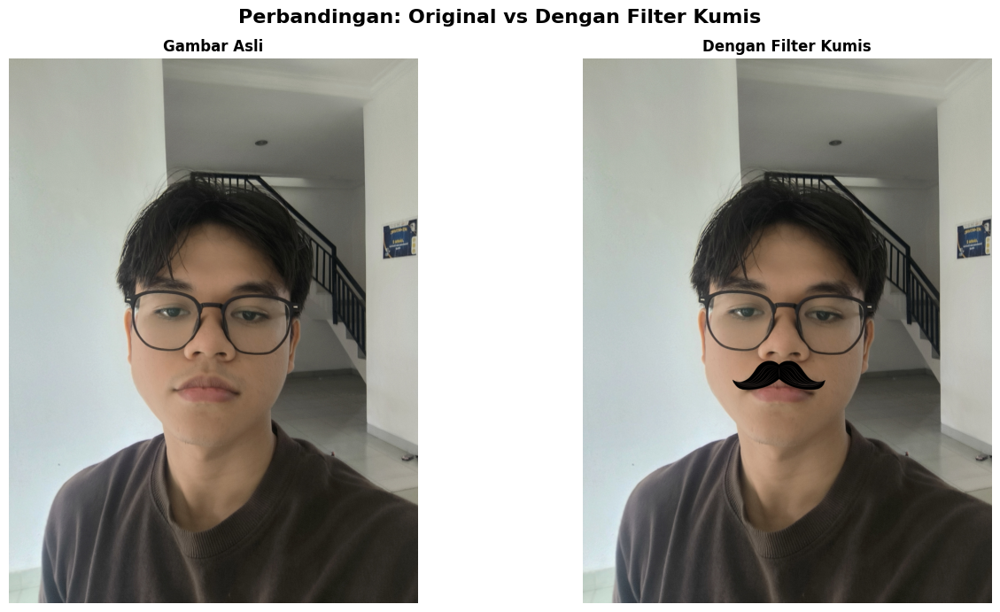

✓ Perbandingan berhasil ditampilkan!


In [ ]:
# Tampilkan perbandingan gambar asli vs dengan filter kumis
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle('Perbandingan: Original vs Dengan Filter Kumis', fontsize=16, fontweight='bold')

# Gambar asli
axes[0].imshow(img_selfie_rgb)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Gambar dengan filter kumis
axes[1].imshow(img_with_mustache)
axes[1].set_title('Dengan Filter Kumis', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print("✓ Perbandingan berhasil ditampilkan!")

### **Soal 5 — Perspektif dan Peningkatan Kualitas Citra**

* Ambil gambar **objek datar** seperti karya tangan di kertas, tulisan di papan tulis, atau foto produk di meja dengan kondisi pencahayaan atau sudut yang tidak ideal.
* Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu, dan jelaskan alasan pilihan Anda).
* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan.
* Jelaskan fungsi masing-masing tahap dan bagaimana teknik ini meningkatkan kualitas visual citra (gunakan **Markdown**).

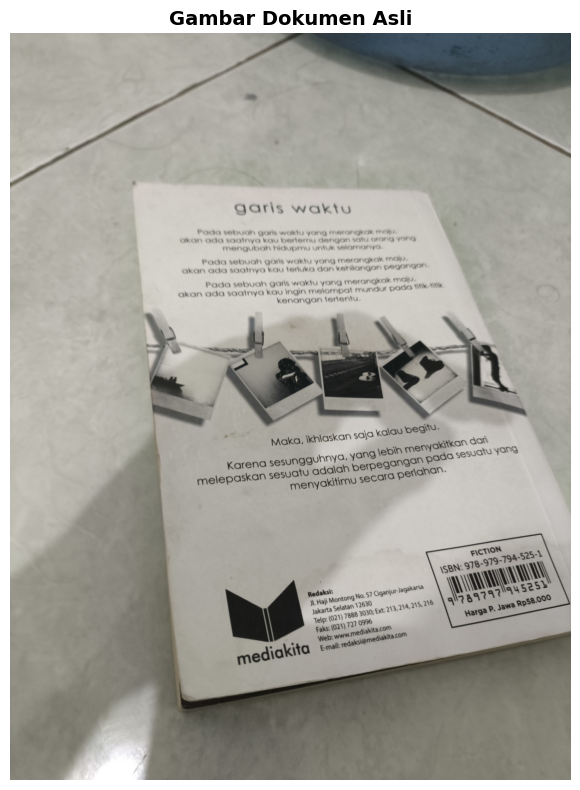

✓ Gambar dokumen berhasil dimuat!
➤ Ukuran: (2332, 1751, 3)


In [ ]:
# Load gambar dokumen
img_doc = cv2.imread('foto_dokumen.jpg')
img_doc_rgb = cv2.cvtColor(img_doc, cv2.COLOR_BGR2RGB)

# Tampilkan gambar asli
plt.figure(figsize=(10, 8))
plt.imshow(img_doc_rgb)
plt.title('Gambar Dokumen Asli', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"✓ Gambar dokumen berhasil dimuat!")
print(f"➤ Ukuran: {img_doc_rgb.shape}")

✓ Step 1: Konversi ke grayscale selesai
✓ Step 2: Koreksi perspektif selesai
✓ Step 3: Otsu thresholding selesai


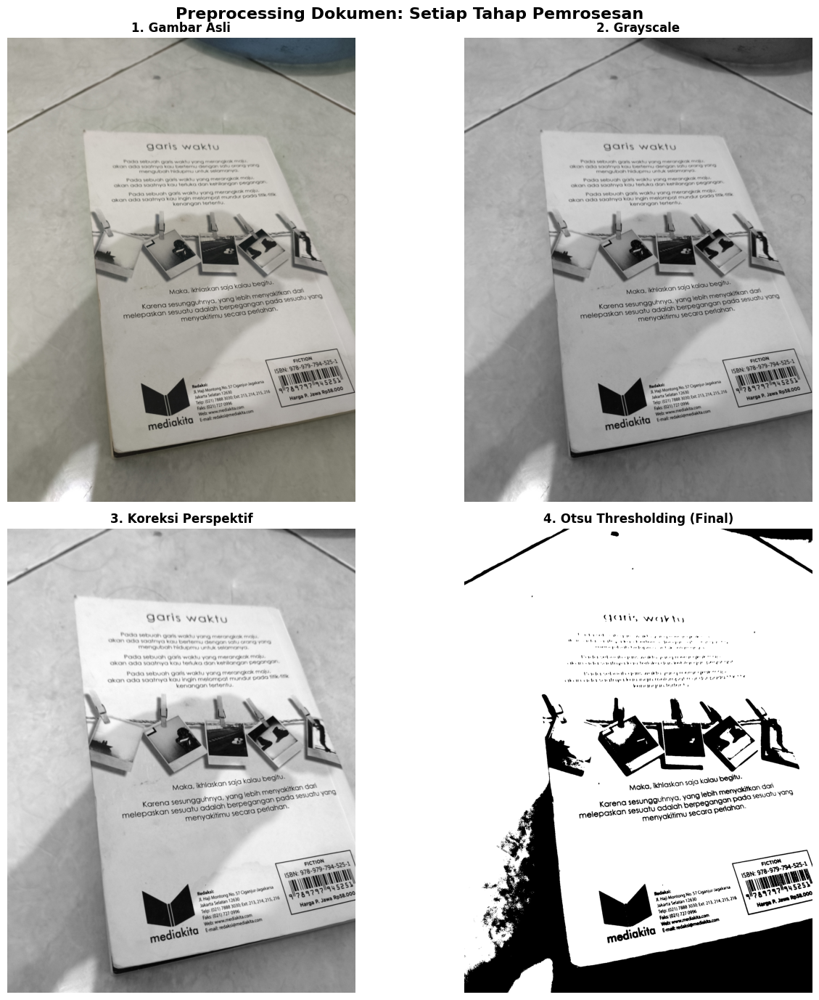


✓ Semua tahap preprocessing selesai!
➤ Ukuran hasil akhir: (2332, 1751)


In [ ]:
# ===== STEP 1: KONVERSI KE GRAYSCALE =====
img_gray = cv2.cvtColor(img_doc, cv2.COLOR_BGR2GRAY)
print("✓ Step 1: Konversi ke grayscale selesai")

# ===== STEP 2: KOREKSI PERSPEKTIF (4 TITIK MANUAL) =====
# Tentukan 4 titik sudut dokumen secara manual
# Format: [kiri atas, kanan atas, kanan bawah, kiri bawah]
# SESUAIKAN koordinat ini dengan posisi dokumen di gambar kamu

h, w = img_gray.shape

# Titik sumber (4 sudut dokumen yang miring/terdistorsi)
# UBAH KOORDINAT INI SESUAI GAMBAR KAMU
pts_src = np.float32([
    [100, 200],   # Kiri atas
    [w-100, 150], # Kanan atas
    [w-50, h-100],  # Kanan bawah
    [50, h-150]     # Kiri bawah
])

# Titik tujuan (bentuk persegi panjang yang rapi)
pts_dst = np.float32([
    [0, 0],           # Kiri atas
    [w, 0],           # Kanan atas
    [w, h],           # Kanan bawah
    [0, h]            # Kiri bawah
])

# Hitung matriks transformasi homografi
matrix = cv2.getPerspectiveTransform(pts_src, pts_dst)

# Terapkan transformasi perspektif
img_perspective = cv2.warpPerspective(img_gray, matrix, (w, h))
print("✓ Step 2: Koreksi perspektif selesai")

# ===== STEP 3: OTSU THRESHOLDING =====
# Terapkan Otsu thresholding untuk membuat dokumen lebih jelas
_, img_threshold = cv2.threshold(img_perspective, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("✓ Step 3: Otsu thresholding selesai")

# ===== TAMPILKAN SEMUA TAHAP DALAM SATU GRID =====
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
fig.suptitle('Preprocessing Dokumen: Setiap Tahap Pemrosesan', fontsize=16, fontweight='bold')

# Original
axes[0, 0].imshow(img_doc_rgb)
axes[0, 0].set_title('1. Gambar Asli', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# Grayscale
axes[0, 1].imshow(img_gray, cmap='gray')
axes[0, 1].set_title('2. Grayscale', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

# Perspektif Corrected
axes[1, 0].imshow(img_perspective, cmap='gray')
axes[1, 0].set_title('3. Koreksi Perspektif', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# Otsu Threshold
axes[1, 1].imshow(img_threshold, cmap='gray')
axes[1, 1].set_title('4. Otsu Thresholding (Final)', fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

print("\n✓ Semua tahap preprocessing selesai!")
print(f"➤ Ukuran hasil akhir: {img_threshold.shape}")

### **Aturan Umum Pengerjaan**

* Kerjakan secara **mandiri**.
* Bantuan AI (seperti ChatGPT, Copilot, dsb.) diperbolehkan **dengan bukti percakapan** (screenshot / link / script percakapan).
* Source code antar mahasiswa harus berbeda.
* Jika mendapat bantuan teman, tuliskan nama dan NIM teman yang membantu.
* Plagiarisme akan dikenakan sanksi sesuai aturan akademik ITERA.
* Cantumkan seluruh **credit dan referensi** yang digunakan di bagian akhir notebook.
* Penjelasan setiap soal ditulis dalam **Markdown**, bukan di dalam komentar kode.

---

### **Aturan Pengumpulan**

* Semua file kerja Anda (notebook `.ipynb`, gambar, dan hasil) **wajib diunggah ke GitHub repository tugas sebelumnya**.

  * Gunakan struktur folder berikut di dalam repo Anda:

    ```
    /Nama_NIM_Repo/ # Nama repo sebelumnya
      ├── assets_ws4/     # berisi semua gambar atau video asli (input)
      ├── results_ws4/    # berisi semua hasil modifikasi dan output
      ├── worksheet4.ipynb
      └── NIM_Worksheet4.pdf
    ```
* File yang dikumpulkan ke **Tally** hanya berupa **hasil PDF** dari notebook Anda, dengan format nama:

  ```
  NIM_Worksheet4.pdf
  ```
* Pastikan notebook telah dijalankan penuh sebelum diekspor ke PDF.
* Sertakan tautan ke repository GitHub Anda di bagian atas notebook atau di halaman pertama PDF.

---

### ✅ **Catatan Akhir**

> Worksheet 4 ini bertujuan mengasah pemahaman Anda tentang manipulasi citra digital secara praktis. Gunakan kreativitas Anda untuk menghasilkan hasil visual yang menarik dan penjelasan konseptual yang jelas.